In [ ]:
#@title 0-1) Upload Required Tool Files
uploaded = files.upload()

for name, data in uploaded.items():
    filename = Path(name).name
    out_path = PY_DIR / filename
    out_path.write_bytes(data)
    print("saved:", out_path)

    if filename.lower().endswith(".zip"):
        extract_dir = PY_DIR
        with zipfile.ZipFile(out_path, "r") as zf:
            zf.extractall(extract_dir)
        print("unzipped:", out_path, "->", extract_dir)


In [ ]:
#@title 0-2) Upload Qualcomm Basis Files
uploaded = files.upload()

for name, data in uploaded.items():
    out_path = MODULE_DIR / Path(name).name
    out_path.write_bytes(data)
    print("saved:", out_path)


In [ ]:
#@title 0-3) Check Uploaded Files
REQUIRED_TOOL_FILES = [
    "precompute_reenact_source_assets.py",
    "prepare_keyframe_restorer_assets.py",
    "qualcomm_metadata_reenact_to_video_keyframe.py",
    "qualcomm_reenact_keyframe_restorers.py",
    "qualcomm_reenact_compositor.py",
    "qualcomm_reenact_frame_planner.py",
    "qualcomm_reenact_source_assets.py",
    "qualcomm_3dmm_to_arkit52.py",
    "overlay_metadata_bbox_video.py",
]

MEAN_FACE_PATH = MODULE_DIR / "meanFace.npy"
SHAPE_BASIS_PATH = MODULE_DIR / "shapeBasis.npy"
BLENDSHAPE_BASIS_PATH = MODULE_DIR / "blendShape.npy"

missing_tools = [name for name in REQUIRED_TOOL_FILES if not (PY_DIR / name).exists()]
missing_basis = [
    str(path.name)
    for path in [MEAN_FACE_PATH, SHAPE_BASIS_PATH, BLENDSHAPE_BASIS_PATH]
    if not path.exists()
]

print("tool dir:", PY_DIR)
print("module dir:", MODULE_DIR)
print("missing tool files:", missing_tools if missing_tools else "none")
print("missing basis files:", missing_basis if missing_basis else "none")
print("mean:", MEAN_FACE_PATH)
print("shape:", SHAPE_BASIS_PATH)
print("blend:", BLENDSHAPE_BASIS_PATH)

if missing_tools or missing_basis:
    print("Upload the missing files, then run this check cell again.")
else:
    print("all required files are ready")


tool dir: /content/py
module dir: /content/module
missing tool files: ['precompute_reenact_source_assets.py', 'prepare_keyframe_restorer_assets.py', 'qualcomm_metadata_reenact_to_video_keyframe.py', 'qualcomm_reenact_keyframe_restorers.py', 'qualcomm_reenact_compositor.py', 'qualcomm_reenact_frame_planner.py', 'qualcomm_reenact_source_assets.py', 'qualcomm_3dmm_to_arkit52.py', 'overlay_metadata_bbox_video.py']
missing basis files: none
mean: /content/module/meanFace.npy
shape: /content/module/shapeBasis.npy
blend: /content/module/blendShape.npy
Upload the missing files, then run this check cell again.


## 1) Source Precompute

이 섹션은 `video`, `metadata`가 없어도 먼저 돌릴 수 있습니다.

결과물:
- `source_meta.npz`
- `source_meta.json`
- bbox preview
- crop preview


In [ ]:
#@title 1-1) Upload Source Image
uploaded = files.upload()

if not uploaded:
    raise ValueError("No file uploaded.")

SOURCE_IMAGE_PATH = None
for name, data in uploaded.items():
    out_path = INPUT_DIR / Path(name).name
    out_path.write_bytes(data)
    SOURCE_IMAGE_PATH = out_path
    print("saved:", out_path)

print("SOURCE_IMAGE_PATH:", SOURCE_IMAGE_PATH)


Saving front.png to front.png
saved: /content/input/front.png
SOURCE_IMAGE_PATH: /content/input/front.png


In [ ]:
#@title 1-2) Source Precompute Options
SOURCE_META_NAME = "front_source.npz"
SOURCE_PAD_RATIO = 0.35
SOURCE_BBOX = None  # e.g. [x, y, w, h]

DEFAULT_LANDMARKER_TASK = MODEL_DIR / "face_landmarker.task"
LANDMARKER_TASK = str(DEFAULT_LANDMARKER_TASK) if DEFAULT_LANDMARKER_TASK.exists() else None

SOURCE_META_PATH = PRECOMP_DIR / SOURCE_META_NAME
print("SOURCE_META_PATH:", SOURCE_META_PATH)
print("LANDMARKER_TASK:", LANDMARKER_TASK)


SOURCE_META_PATH: /content/precomputed/front_source.npz
LANDMARKER_TASK: /content/models/face_landmarker.task


In [ ]:
!unzip -o /content/py/colab_py_bundle.zip -d /content/py
!ls -la /content/py


Archive:  /content/py/colab_py_bundle.zip
  inflating: /content/py/overlay_metadata_bbox_video.py  
  inflating: /content/py/precompute_reenact_source_assets.py  
  inflating: /content/py/prepare_keyframe_restorer_assets.py  
  inflating: /content/py/qualcomm_3dmm_to_arkit52.py  
  inflating: /content/py/qualcomm_metadata_reenact_to_video_keyframe.py  
  inflating: /content/py/qualcomm_reenact_compositor.py  
  inflating: /content/py/qualcomm_reenact_frame_planner.py  
  inflating: /content/py/qualcomm_reenact_keyframe_restorers.py  
  inflating: /content/py/qualcomm_reenact_source_assets.py  
total 184
drwxr-xr-x 2 root root  4096 May  8 07:36 .
drwxr-xr-x 1 root root  4096 May  8 07:36 ..
-rw-r--r-- 1 root root 32210 May  8 07:32 colab_py_bundle.zip
-rw-r--r-- 1 root root 15267 May  6 07:44 overlay_metadata_bbox_video.py
-rw-r--r-- 1 root root  8740 May  6 07:44 precompute_reenact_source_assets.py
-rw-r--r-- 1 root root  4327 May  6 07:44 prepare_keyframe_restorer_assets.py
-rw-r--r-

In [ ]:
#@title 1-3) Build source_meta.npz
cmd = [
    sys.executable,
    str(PY_DIR / "precompute_reenact_source_assets.py"),
    "--source-image", str(SOURCE_IMAGE_PATH),
    "--output", str(SOURCE_META_PATH),
    "--mean-face", str(MEAN_FACE_PATH),
    "--shape-basis", str(SHAPE_BASIS_PATH),
    "--blendshape-basis", str(BLENDSHAPE_BASIS_PATH),
    "--source-pad-ratio", str(SOURCE_PAD_RATIO),
    "--save-preview",
]

if SOURCE_BBOX is not None:
    cmd += ["--source-bbox", *[str(v) for v in SOURCE_BBOX]]
if LANDMARKER_TASK:
    cmd += ["--landmarker-task", str(LANDMARKER_TASK)]

run_cmd(cmd)


/usr/bin/python3 /content/py/precompute_reenact_source_assets.py --source-image /content/input/front.png --output /content/precomputed/front_source.npz --mean-face /content/module/meanFace.npy --shape-basis /content/module/shapeBasis.npy --blendshape-basis /content/module/blendShape.npy --source-pad-ratio 0.35 --save-preview --landmarker-task /content/models/face_landmarker.task


{
  "output": "/content/precomputed/front_source.npz",
  "source_image": "/content/input/front.png",
  "source_bbox_xyxy": [
    58.0,
    293.0,
    847.0,
    1082.0
  ],
  "crop_size": 256,
  "source_points_shape": [
    68,
    2
  ],
  "source_coeff_shape": [
    264
  ],
  "crop_preview": "/content/precomputed/front_source_crop.png",
  "bbox_preview": "/content/precomputed/front_source_bbox.png"
}


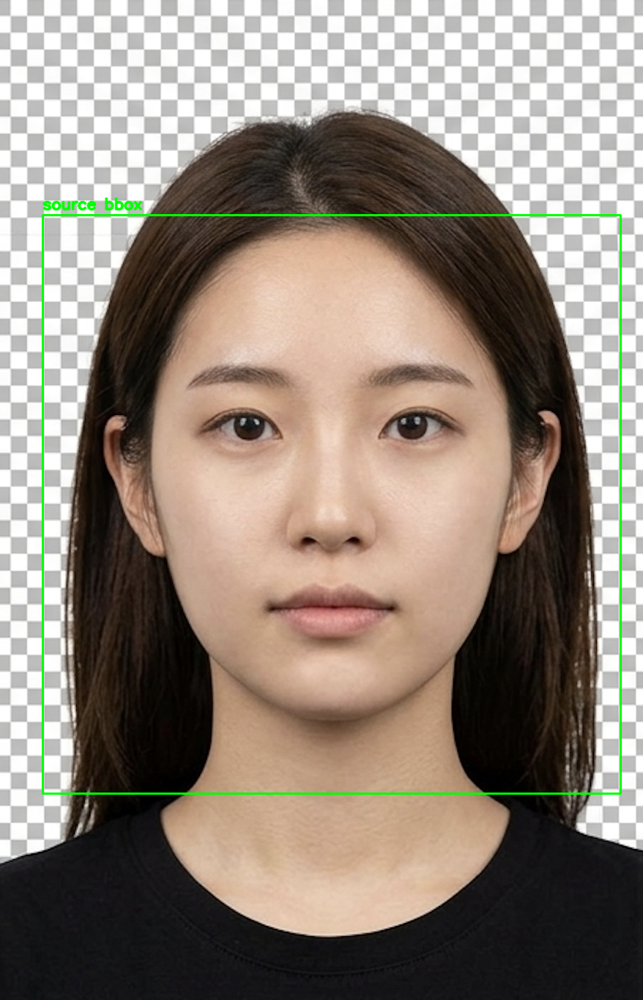

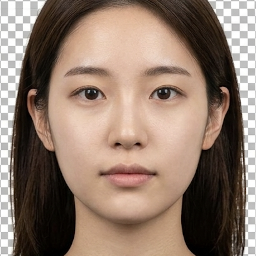

In [ ]:
#@title 1-4) Preview Precomputed Assets
source_meta_json = SOURCE_META_PATH.with_suffix(".json")
bbox_preview = SOURCE_META_PATH.with_name(SOURCE_META_PATH.stem + "_bbox.png")
crop_preview = SOURCE_META_PATH.with_name(SOURCE_META_PATH.stem + "_crop.png")

print(source_meta_json.read_text(encoding="utf-8"))
display(Image(filename=str(bbox_preview)))
display(Image(filename=str(crop_preview)))


## 2) Runtime Inputs

여기부터는 실제 `metadata.json`과 `video.mp4`가 생긴 뒤에 실행합니다.


In [ ]:
#@title 2-1) Upload Video + Metadata
uploaded = files.upload()

VIDEO_PATH = None
METADATA_PATH = None

for name, data in uploaded.items():
    out_path = INPUT_DIR / Path(name).name
    out_path.write_bytes(data)
    lower = name.lower()
    if lower.endswith(".mp4") or lower.endswith(".mov") or lower.endswith(".mkv"):
        VIDEO_PATH = "/content/input/meta.mp4"
    elif lower.endswith(".json"):
        METADATA_PATH = "/content/input/metadata.json"
    print("saved:", out_path)

print("VIDEO_PATH:", VIDEO_PATH)
print("METADATA_PATH:", METADATA_PATH)

if VIDEO_PATH is None or METADATA_PATH is None:
    raise ValueError("Upload both a video file and a metadata json file.")


VIDEO_PATH: None
METADATA_PATH: None


ValueError: Upload both a video file and a metadata json file.

In [ ]:
#@title 2-2) Shared Wrap Options
OUTPUT_BASENAME = "wrap_keyframe"

FACE_MODE = "dominant_track"
TRACKING_ID = None
EXCLUDE_TRACKING_IDS = []

WARP_EVERY = 3
TRANSITION_FRAMES = 1
KEY_RESTORER_EVERY = 1

CLONE_MODE = "alpha"
ALPHA = 1.0
FEATHER_PX = 16
MASK_EXPAND_PX = 0
MASK_GAMMA = 0.8

COLOR_MATCH = "lab"
COLOR_MATCH_STRENGTH = 0.85
COLOR_MATCH_EXPAND_PX = 12
COLOR_MATCH_DOWNSAMPLE = 2

SHIFT_X = 0
SHIFT_Y = 0
SMOOTH_FACTOR = 0.85
SCALE = 1.12

PAD_LEFT = 0.02
PAD_RIGHT = 0.18
PAD_TOP = 0.08
PAD_BOTTOM = 0.18

DRAW_BBOX = False
HIDE_LABELS = False
LINE_THICKNESS = 3


In [ ]:
#@title 2-3) Common Command Builder
def build_common_wrap_cmd(output_video_path):
    cmd = [
        sys.executable,
        str(PY_DIR / "qualcomm_metadata_reenact_to_video_keyframe.py"),
        "--metadata", str(METADATA_PATH),
        "--video", str(VIDEO_PATH),
        "--source-meta", str(SOURCE_META_PATH),
        "--output-video", str(output_video_path),
        "--mean-face", str(MEAN_FACE_PATH),
        "--shape-basis", str(SHAPE_BASIS_PATH),
        "--blendshape-basis", str(BLENDSHAPE_BASIS_PATH),
        "--face-mode", FACE_MODE,
        "--warp-every", str(WARP_EVERY),
        "--transition-frames", str(TRANSITION_FRAMES),
        "--key-restorer-every", str(KEY_RESTORER_EVERY),
        "--clone-mode", CLONE_MODE,
        "--alpha", str(ALPHA),
        "--feather-px", str(FEATHER_PX),
        "--mask-expand-px", str(MASK_EXPAND_PX),
        "--mask-gamma", str(MASK_GAMMA),
        "--color-match", COLOR_MATCH,
        "--color-match-strength", str(COLOR_MATCH_STRENGTH),
        "--color-match-expand-px", str(COLOR_MATCH_EXPAND_PX),
        "--color-match-downsample", str(COLOR_MATCH_DOWNSAMPLE),
        "--shift-x", str(SHIFT_X),
        "--shift-y", str(SHIFT_Y),
        "--smooth-factor", str(SMOOTH_FACTOR),
        "--scale", str(SCALE),
        "--pad-left", str(PAD_LEFT),
        "--pad-right", str(PAD_RIGHT),
        "--pad-top", str(PAD_TOP),
        "--pad-bottom", str(PAD_BOTTOM),
        "--line-thickness", str(LINE_THICKNESS),
    ]

    if TRACKING_ID is not None:
        cmd += ["--tracking-id", str(TRACKING_ID)]
    if EXCLUDE_TRACKING_IDS:
        cmd += ["--exclude-tracking-id", *[str(v) for v in EXCLUDE_TRACKING_IDS]]
    if DRAW_BBOX:
        cmd += ["--draw-bbox"]
    if HIDE_LABELS:
        cmd += ["--hide-labels"]
    return cmd


In [ ]:
 #@title 1-1) Source Image Path
SOURCE_IMAGE_PATH = INPUT_DIR / "front.png"
print("SOURCE_IMAGE_PATH:", SOURCE_IMAGE_PATH)
print("exists:", SOURCE_IMAGE_PATH.exists())
#@title 2-1) Video + Metadata Paths
VIDEO_PATH = INPUT_DIR / "meta.mp4"
METADATA_PATH = INPUT_DIR / "metadata.json"
print("VIDEO_PATH:", VIDEO_PATH)
print("METADATA_PATH:", METADATA_PATH)
print("video exists:", VIDEO_PATH.exists())
print("metadata exists:", METADATA_PATH.exists())
#@title 4-1) GPEN Model Path
GPEN_MODEL_PATH = MODEL_DIR / "GPEN-BFR-256.onnx"
print("GPEN_MODEL_PATH:", GPEN_MODEL_PATH)
print("exists:", GPEN_MODEL_PATH.exists())
MEAN_FACE_PATH = MODULE_DIR / "meanFace.npy"
SHAPE_BASIS_PATH = MODULE_DIR / "shapeBasis.npy"
BLENDSHAPE_BASIS_PATH = MODULE_DIR / "blendShape.npy"

print("MEAN_FACE_PATH:", MEAN_FACE_PATH, MEAN_FACE_PATH.exists())
print("SHAPE_BASIS_PATH:", SHAPE_BASIS_PATH, SHAPE_BASIS_PATH.exists())
print("BLENDSHAPE_BASIS_PATH:", BLENDSHAPE_BASIS_PATH, BLENDSHAPE_BASIS_PATH.exists())


SOURCE_IMAGE_PATH: /content/input/front.png
exists: True
VIDEO_PATH: /content/input/meta.mp4
METADATA_PATH: /content/input/metadata.json
video exists: True
metadata exists: True
GPEN_MODEL_PATH: /content/models/GPEN-BFR-256.onnx
exists: True
MEAN_FACE_PATH: /content/module/meanFace.npy True
SHAPE_BASIS_PATH: /content/module/shapeBasis.npy True
BLENDSHAPE_BASIS_PATH: /content/module/blendShape.npy True


## 3) Wrap Without GPEN

가장 기본이 되는 버전입니다.


In [ ]:
VIDEO_PATH = INPUT_DIR / "input.mp4"
METADATA_PATH = INPUT_DIR / "metadata.json"

print("VIDEO_PATH =", VIDEO_PATH)
print("METADATA_PATH =", METADATA_PATH)
print("video exists =", VIDEO_PATH.exists())
print("metadata exists =", METADATA_PATH.exists())


VIDEO_PATH = /content/input/input.mp4
METADATA_PATH = /content/input/metadata.json
video exists = False
metadata exists = True


In [ ]:
from pathlib import Path
import json
import numpy as np

paths = [
    "/content/input/metadata.json",
    "/content/input/input.mp4",
    "/content/precomputed/front_source.npz",
    "/content/module/meanFace.npy",
    "/content/module/shapeBasis.npy",
    "/content/module/blendShape.npy",
]

for p in paths:
    print(p, Path(p).exists())

payload = np.load("/content/precomputed/front_source.npz")
print("npz keys:", payload.files)

meta = json.loads(Path("/content/input/metadata.json").read_text())
print("metadata keys:", meta.keys())
print("frames is list:", isinstance(meta.get("frames"), list))
print("num frames:", len(meta.get("frames", [])) if isinstance(meta.get("frames"), list) else "not-list")


/content/input/metadata.json True
/content/input/input.mp4 True
/content/precomputed/front_source.npz True
/content/module/meanFace.npy True
/content/module/shapeBasis.npy True
/content/module/blendShape.npy True
npz keys: ['source_bbox_xyxy', 'source_crop_bgr', 'source_coeff_264', 'source_points', 'crop_size', 'source_image_path']
metadata keys: dict_keys(['frames'])
frames is list: True
num frames: 583


In [ ]:
#@title 3-1) Run Keyframe Wrap Without GPEN
OUTPUT_NO_GPEN = OUTPUT_DIR / f"{OUTPUT_BASENAME}_no_gpen.mp4"
cmd = build_common_wrap_cmd(OUTPUT_NO_GPEN)
run_cmd(cmd)


/usr/bin/python3 /content/py/qualcomm_metadata_reenact_to_video_keyframe.py --metadata /content/input/metadata.json --video /content/input/input.mp4 --source-meta /content/precomputed/front_source.npz --output-video /content/outputs/wrap_keyframe_no_gpen.mp4 --mean-face /content/module/meanFace.npy --shape-basis /content/module/shapeBasis.npy --blendshape-basis /content/module/blendShape.npy --face-mode dominant_track --warp-every 3 --transition-frames 1 --key-restorer-every 1 --clone-mode alpha --alpha 1.0 --feather-px 16 --mask-expand-px 0 --mask-gamma 0.8 --color-match lab --color-match-strength 0.85 --color-match-expand-px 12 --color-match-downsample 2 --shift-x 0 --shift-y 0 --smooth-factor 0.85 --scale 1.12 --pad-left 0.02 --pad-right 0.18 --pad-top 0.08 --pad-bottom 0.18 --line-thickness 3


In [ ]:
#@title 3-2) Preview No-GPEN Output
Video(str(OUTPUT_NO_GPEN), embed=True)


## 4) Wrap With GPEN

이 버전은 같은 keyframe wrap 결과에 GPEN을 키프레임 단위로만 얹습니다.


In [ ]:
#@title 4-1) Upload GPEN ONNX Model
GPEN_MODEL_PATH = MODEL_DIR / "GPEN-BFR-256.onnx"

if not GPEN_MODEL_PATH.exists():
    uploaded = files.upload()
    if not uploaded:
        raise ValueError("Upload GPEN-BFR-256.onnx first.")
    for name, data in uploaded.items():
        out_path = MODEL_DIR / Path(name).name
        out_path.write_bytes(data)
        print("saved:", out_path)
        if out_path.name == "GPEN-BFR-256.onnx":
            GPEN_MODEL_PATH = out_path

if not GPEN_MODEL_PATH.exists():
    raise ValueError(f"GPEN model not found: {GPEN_MODEL_PATH}")

print("GPEN_MODEL_PATH:", GPEN_MODEL_PATH)


In [ ]:
#@title 4-2) GPEN Options
GPEN_PROVIDER = "cuda"
GPEN_INPUT_SIZE = 256
GPEN_KEY_RESTORER_EVERY = 1
GPEN_KEY_RESTORER_MASK_EXPAND_PX = 6
GPEN_KEY_RESTORER_FEATHER_PX = 6

cmd = [
    sys.executable,
    str(PY_DIR / "prepare_keyframe_restorer_assets.py"),
    "--gpen-model", str(GPEN_MODEL_PATH),
    "--gpen-provider", GPEN_PROVIDER,
    "--gpen-input-size", str(GPEN_INPUT_SIZE),
]
run_cmd(cmd)


In [ ]:
#@title 4-3) Run Keyframe Wrap With GPEN
OUTPUT_WITH_GPEN = OUTPUT_DIR / f"{OUTPUT_BASENAME}_with_gpen.mp4"
cmd = build_common_wrap_cmd(OUTPUT_WITH_GPEN)
cmd += [
    "--key-restorer-every", str(GPEN_KEY_RESTORER_EVERY),
    "--gpen-model", str(GPEN_MODEL_PATH),
    "--gpen-provider", GPEN_PROVIDER,
    "--gpen-input-size", str(GPEN_INPUT_SIZE),
    "--key-restorer-mask-expand-px", str(GPEN_KEY_RESTORER_MASK_EXPAND_PX),
    "--key-restorer-feather-px", str(GPEN_KEY_RESTORER_FEATHER_PX),
]
run_cmd(cmd)


In [ ]:
#@title 4-4) Preview GPEN Output
Video(str(OUTPUT_WITH_GPEN), embed=True)


## 5) Download Outputs


In [ ]:
#@title 5-1) Download Files
download_candidates = [
    SOURCE_META_PATH,
    SOURCE_META_PATH.with_suffix(".json"),
    globals().get("OUTPUT_NO_GPEN"),
    globals().get("OUTPUT_WITH_GPEN"),
]

for item in download_candidates:
    if item is None:
        continue
    path = Path(item)
    if path.exists():
        print("download:", path)
        files.download(str(path))
